In [1]:
from matplotlib import pyplot as plt
from pathlib import Path
import numpy as np
import rasterio
import traceback


def geotiff_stretch(arr, p=2, a_min=0, a_max=1):
    lo = np.percentile(arr, p)
    hi = np.percentile(arr, 100 - p)
    return np.clip((arr - lo) / (hi - lo), a_min, a_max)


def geotiff_map_class(mask):
    class_mask = np.zeros_like(mask, dtype=np.uint8)
    class_mask[(mask >= 0) & (mask <= 50)] = 0  # background
    class_mask[(mask >= 100) & (mask <= 200)] = 1  # shadow
    class_mask[(mask >= 250) & (mask <= 255)] = 2  # cloud
    return class_mask


def geotiff_intersection_over_union_and_coverage(pred, true, n_classes=3):
    """
    Calculates intersection and union for a batch of images.
    Calculates coverage of each class for a batch of images.
    """
    total_pixels = true.size
    valid_pixel_mask = (true != 255)  # valid pixel mask
    true = true[valid_pixel_mask]
    pred = pred[valid_pixel_mask]

    iou_list = []
    true_coverage_list = []
    pred_coverage_list = []
    for cls in range(n_classes):
        # skip background
        if cls == 0:
            continue

        # Prediction/ground truth mask of the current category
        true_cls = (true == cls)
        pred_cls = (pred == cls)

        # Intersection and union totals
        intersection = np.logical_and(true_cls, pred_cls)
        union = np.logical_or(true_cls, pred_cls)

        iou = intersection.sum() / (union.sum() + 1e-8)
        iou_list.append(min(iou, 1))

        true_coverage = true_cls.sum() / total_pixels
        pred_coverage = pred_cls.sum() / total_pixels
        true_coverage_list.append(true_coverage)
        pred_coverage_list.append(pred_coverage)

    mIoU = np.mean(iou_list)

    return mIoU, true_coverage_list, pred_coverage_list


def geotiff_show_rgb_thumbnail(data_path, pred_path=None, max_size=512):
    with rasterio.open(data_path) as src:
        true = geotiff_map_class(src.read(5).astype(np.uint8))

        h, w = src.height, src.width
        scale = min(max_size / w, max_size / h)
        new_w, new_h = int(w * scale), int(h * scale)
        data = src.read(out_shape=(src.count, new_h, new_w),
                        resampling=rasterio.enums.Resampling.bilinear)

    b = data[0]
    g = data[1]
    r = data[2]
    nir = data[3]
    mask = data[4]
    rgb = np.dstack((r, g, b))

    rgb = geotiff_stretch(rgb)

    fig, ax = plt.subplots(1, 3, figsize=(24, 8))


    ax[0].imshow(rgb)
    ax[0].set_title("RGB Image")

    ax[1].imshow(mask)
    ax[1].set_title("True Mask Image")

    if pred_path:
        with rasterio.open(pred_path) as src2:
            pred = src2.read(1).astype(np.uint8)
            pred_mask = src2.read(indexes=(1),
                                  out_shape=(src2.count, new_h, new_w),
                                  resampling=rasterio.enums.Resampling.bilinear).astype(np.uint8)

        iou, true_cov, pred_cov = geotiff_intersection_over_union_and_coverage(pred, true)

        ax[1].set_title(f"True Mask Image\nshadow coverage={true_cov[0]:04f} | cloud coverage={true_cov[1]:04f} ")
        ax[2].imshow(pred_mask)
        ax[2].set_title(f"Predicted Mask Image with iou={iou:04f}\nshadow coverage={pred_cov[0]:04f} | cloud coverage={pred_cov[1]:04f}")

    plt.tight_layout()
    plt.show()

In [2]:
data_dir = Path("../dataset/GF1_WHU/compress")
data_tif_files = list(data_dir.glob("*.tif"))
data_tif_files[0].stem

'GF1_WFV1_E102.0_N28.0_20140302_L2A0000280476'

In [3]:
pred_dir = Path("../dataset/predictions")
pred_tif_files = list(pred_dir.glob("*_PredictedMask.tif"))
pred_tif_files

[WindowsPath('data/predictions/GF1_WFV1_E73.7_N56.3_20130712_L2A0000356200_PredictedMask.tif'),
 WindowsPath('data/predictions/GF1_WFV4_E121.8_N18.5_20130508_L2A0000017773_PredictedMask.tif'),
 WindowsPath('data/predictions/GF1_WFV4_W152.9_N21.9_20160806_L2A0001748198_PredictedMask.tif'),
 WindowsPath('data/predictions/GF1_WFV4_W97.5_N38.5_20140517_L2A0000244685_PredictedMask.tif')]

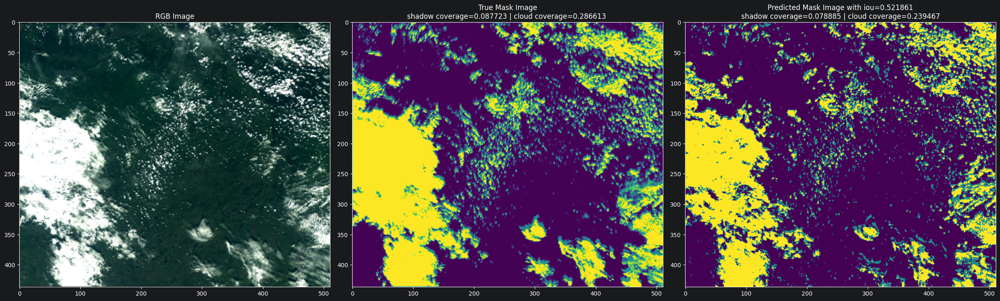

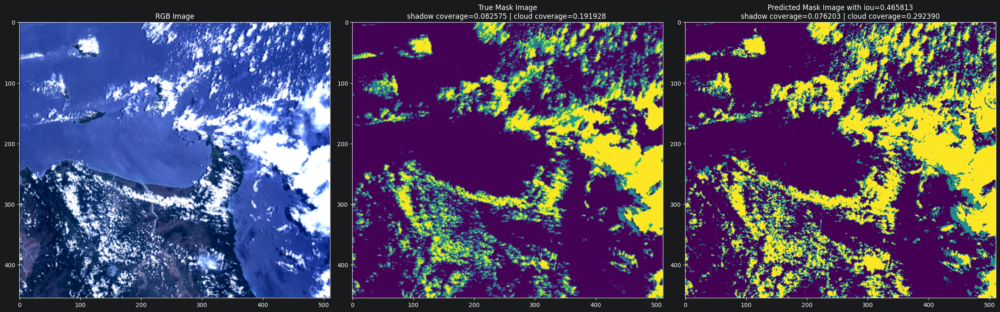

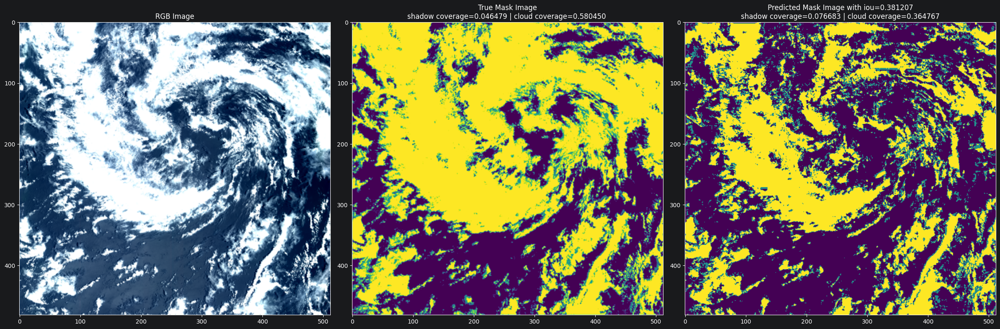

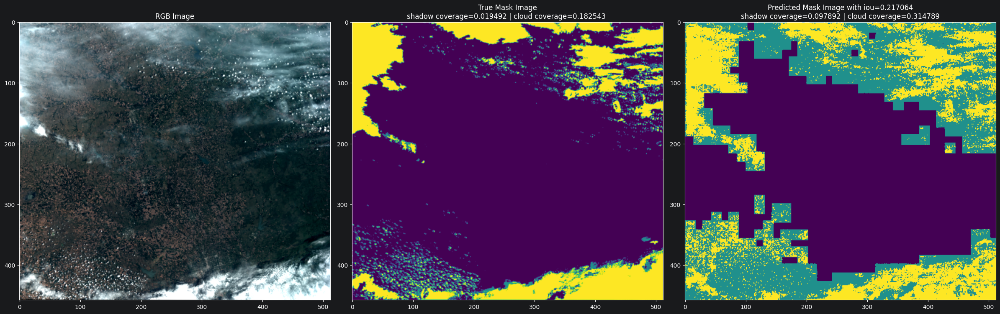

In [4]:
try:
    for data_tif_file in data_tif_files:
        for pred_tif_file in pred_tif_files:
            if str(data_tif_file.stem) in str(pred_tif_file):
                geotiff_show_rgb_thumbnail(data_tif_file, pred_tif_file)
except Exception as e:
    traceback.print_exc()